## Deep Dream 

The aim is to create a computer vision algorithm by creating dream-like effects on a sample picture. 

---

In [1]:
# Import libraries

import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random 

In [2]:
# Import model with pre-trained weights 

base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [3]:
# Maximize the activations of these layers

# names = ['mixed3', 'mixed5', 'mixed8', 'mixed9']
names = ['mixed3', 'mixed5']
# names = ['mixed5']

layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
deepdream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

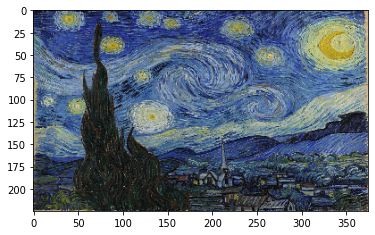

In [4]:
# Sample image and pre-processing 

sample_image= tf.keras.preprocessing.image.load_img(r'/Users/mareksturek/Documents/GitHub/real-application/data/starynight.jpg', target_size = (225, 375))
plt.imshow(sample_image);

In [5]:
# Shape image

np.shape(sample_image)

(225, 375, 3)

In [6]:
# Normalize the input image

sample_image = np.array(sample_image)/255.0
sample_image.shape

(225, 375, 3)

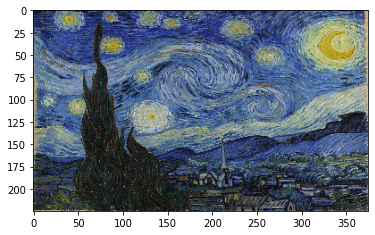

In [7]:
# Normalized image

plt.imshow(sample_image);

In [8]:
# Making sure that the image in normalized

sample_image.max()

0.9568627450980393

In [9]:
sample_image.min()

0.0

In [10]:
# Pretrained mode and activations

sample_image = tf.keras.preprocessing.image.img_to_array(sample_image)
sample_image.shape

(225, 375, 3)

In [11]:
sample_image = tf.Variable(tf.keras.applications.inception_v3.preprocess_input(sample_image))

In [12]:
sample_image = tf.expand_dims(sample_image, axis = 0)
np.shape(sample_image)

TensorShape([1, 225, 375, 3])

In [13]:
# Run the model by feeding in an input image and taking a look at the activations "Neuron outputs"

activations = deepdream_model(sample_image)
activations

[<tf.Tensor: shape=(1, 12, 21, 768), dtype=float32, numpy=
 array([[[[0.        , 0.6520924 , 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.63984734, 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ],
          ...,
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ]],
 
         [[0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.08415318, 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ],
          ...,
        

In [14]:
len(activations)

2

In [15]:
# Function used for loss calculations

def calc_loss(image, model):

# It works by feedforwarding the input image through the network and generate activations
# Then obtain the average and sum of those outputs

  img_batch = tf.expand_dims(image, axis=0) # Convert into batch format
  layer_activations = model(img_batch) # Run the model
  print('ACTIVATION VALUES (LAYER OUTPUT) =\n', layer_activations)
  # print('ACTIVATION SHAPE =\n', np.shape(layer_activations))

  losses = [] # accumulator to hold all the losses
  for act in layer_activations:
    loss = tf.math.reduce_mean(act) # calculate mean of each activation 
    losses.append(loss)
  
  print('LOSSES (FROM MULTIPLE ACTIVATION LAYERS) = ', losses)
  print('LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) = ', np.shape(losses))
  print('SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)= ', tf.reduce_sum(losses))

  return  tf.reduce_sum(losses) # Calculate sum 

In [16]:
# Test the function

Sample_Image= tf.keras.preprocessing.image.load_img(r'/Users/mareksturek/Documents/GitHub/real-application/data/starynight.jpg', target_size = (225, 375))
Sample_Image = np.array(Sample_Image)/255.0
Sample_Image = tf.keras.preprocessing.image.img_to_array(Sample_Image)
Sample_Image = tf.Variable(tf.keras.applications.inception_v3.preprocess_input(Sample_Image))

loss = calc_loss(Sample_Image, deepdream_model)

ACTIVATION VALUES (LAYER OUTPUT) =
 [<tf.Tensor: shape=(1, 12, 21, 768), dtype=float32, numpy=
array([[[[0.        , 0.6520924 , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.63984734, 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ]],

        [[0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.08415318, 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
       

In [17]:
loss # Sum up the losses from both activations

<tf.Tensor: shape=(), dtype=float32, numpy=0.43999037>

In [18]:
# Deep dream function

@tf.function
def deepdream(model, image, step_size):
    with tf.GradientTape() as tape:
      # This needs gradients relative to `img`
      # `GradientTape` only watches `tf.Variable`s by default
      tape.watch(image)
      loss = calc_loss(image, model) # call the function that calculate the loss 

    # Calculate the gradient of the loss with respect to the pixels of the input image.
    # The syntax is as follows: dy_dx = g.gradient(y, x) 
    gradients = tape.gradient(loss, image)

    print('GRADIENTS =\n', gradients)
    print('GRADIENTS SHAPE =\n', np.shape(gradients))

    # tf.math.reduce_std computes the standard deviation of elements across dimensions of a tensor
    gradients /= tf.math.reduce_std(gradients)  

    # In gradient ascent, the "loss" is maximized so that the input image increasingly "excites" the layers.
    # You can update the image by directly adding the gradients (because they're the same shape!)
    image = image + gradients * step_size
    image = tf.clip_by_value(image, -1, 1)

    return loss, image

In [19]:
# Run Deep dream function 

def run_deep_dream_simple(model, image, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  image = tf.keras.applications.inception_v3.preprocess_input(image)

  for step in range(steps):
    loss, image = deepdream(model, image, step_size)
    
    if step % 100 == 0:
      plt.figure(figsize=(12,12))
      plt.imshow(deprocess(image))
      plt.show()
      print ("Step {}, loss {}".format(step, loss))

  # clear_output(wait=True)
  plt.figure(figsize=(12,12))
  plt.imshow(deprocess(image))
  plt.show()

  return deprocess(image)

In [20]:
# Deprocessing 

def deprocess(image):
  image = 255*(image + 1.0)/2.0
  return tf.cast(image, tf.uint8)

ACTIVATION VALUES (LAYER OUTPUT) =
 [<tf.Tensor 'functional_1/mixed3/concat:0' shape=(1, 18, 18, 768) dtype=float32>, <tf.Tensor 'functional_1/mixed5/concat:0' shape=(1, 18, 18, 768) dtype=float32>]
LOSSES (FROM MULTIPLE ACTIVATION LAYERS) =  [<tf.Tensor 'Mean:0' shape=() dtype=float32>, <tf.Tensor 'Mean_1:0' shape=() dtype=float32>]
LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) =  (2,)
SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)=  Tensor("Sum:0", shape=(), dtype=float32)
GRADIENTS =
 Tensor("gradient_tape/Reshape_3:0", shape=(320, 320, 3), dtype=float32)
GRADIENTS SHAPE =
 (320, 320, 3)


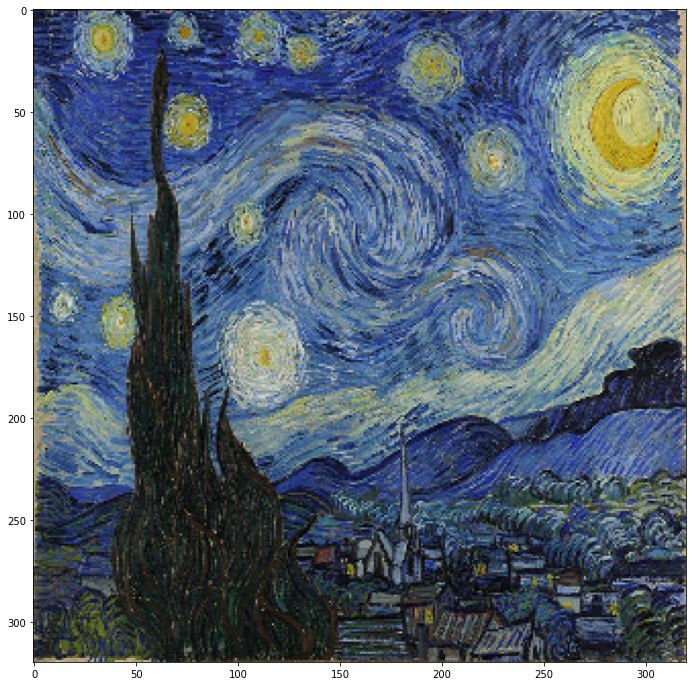

Step 0, loss 0.6506716012954712


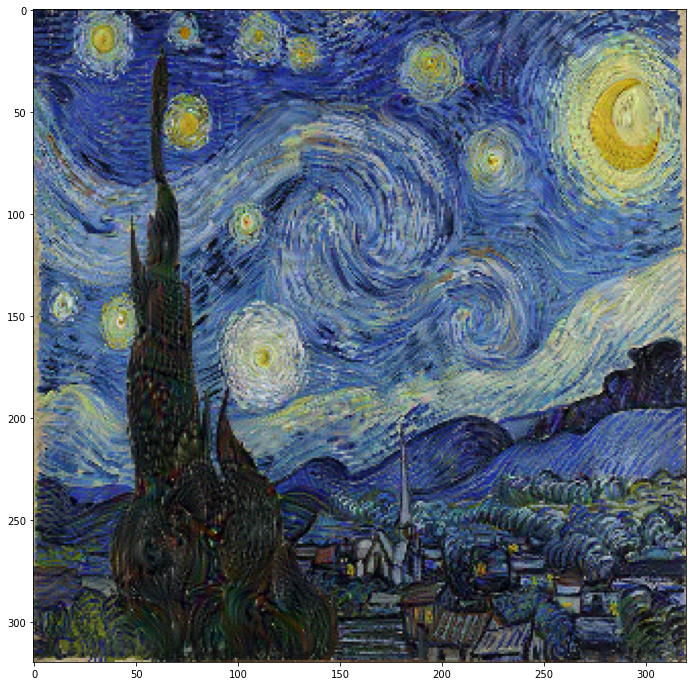

Step 100, loss 1.4006115198135376


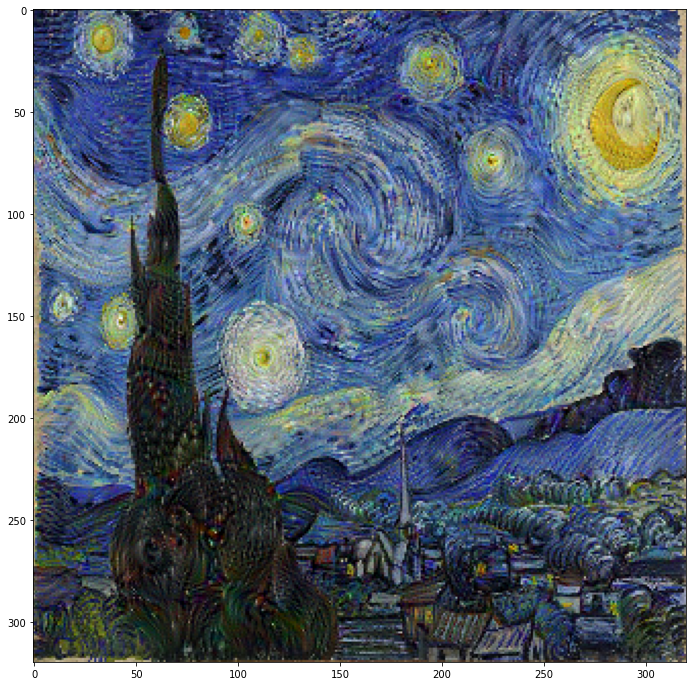

Step 200, loss 1.6914913654327393


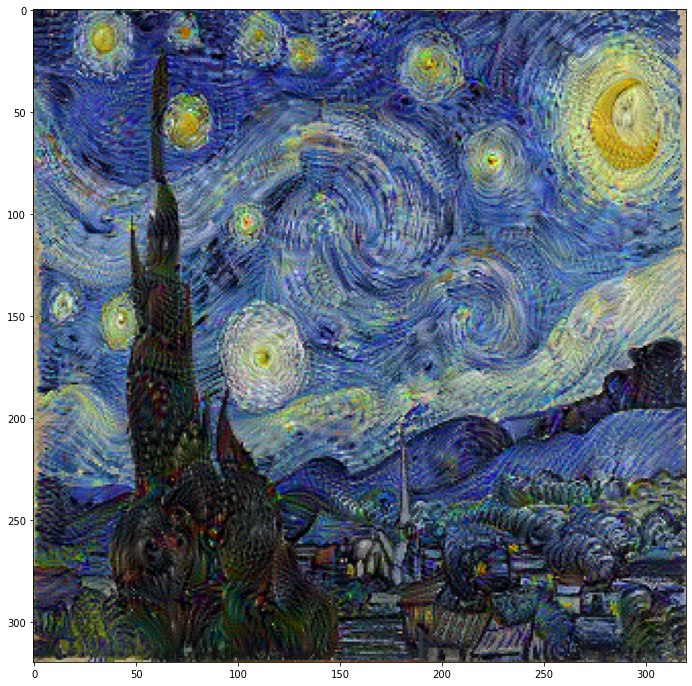

Step 300, loss 1.866666316986084


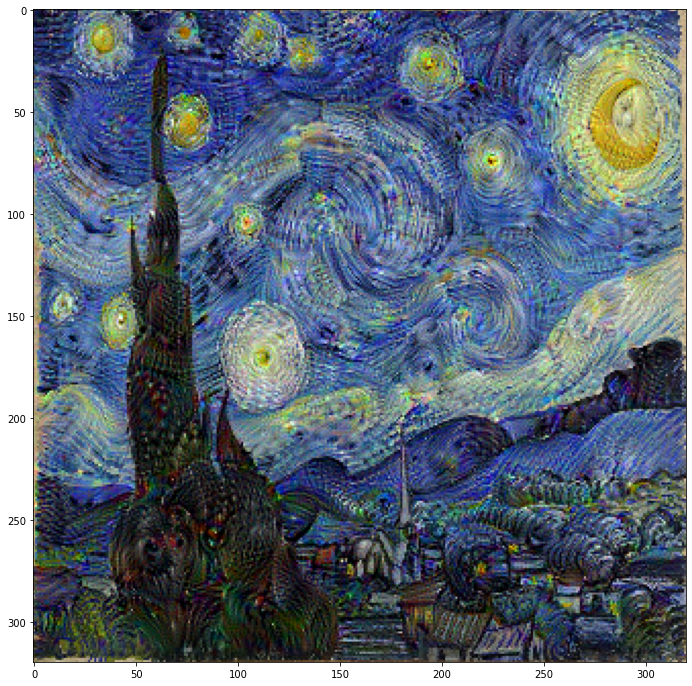

Step 400, loss 1.9894678592681885


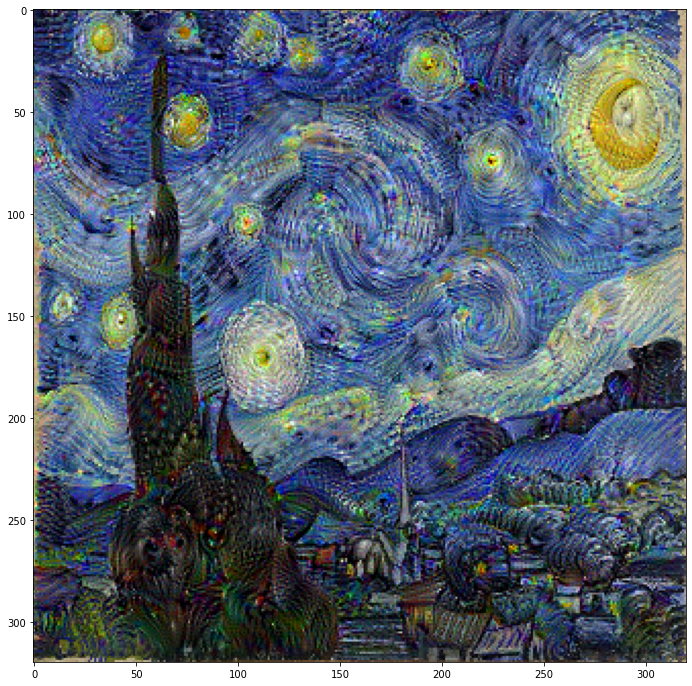

Step 500, loss 2.088754892349243


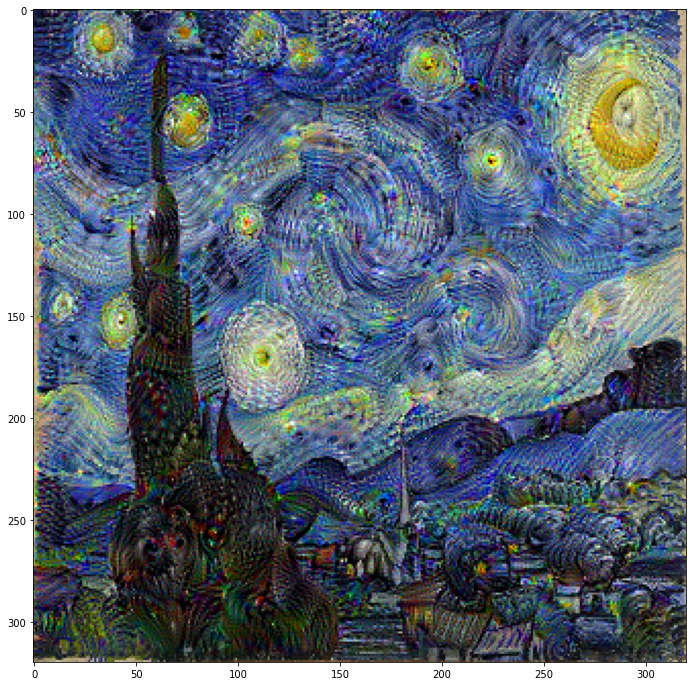

Step 600, loss 2.173126459121704


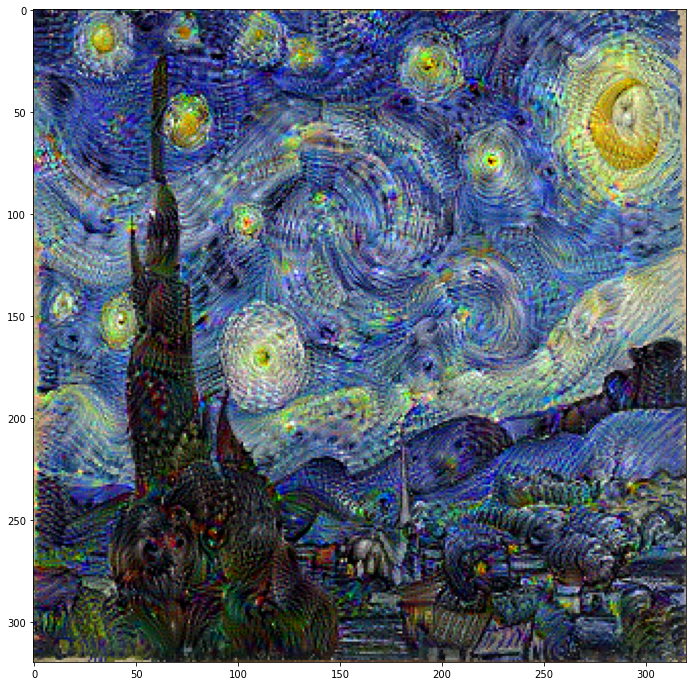

Step 700, loss 2.246851682662964


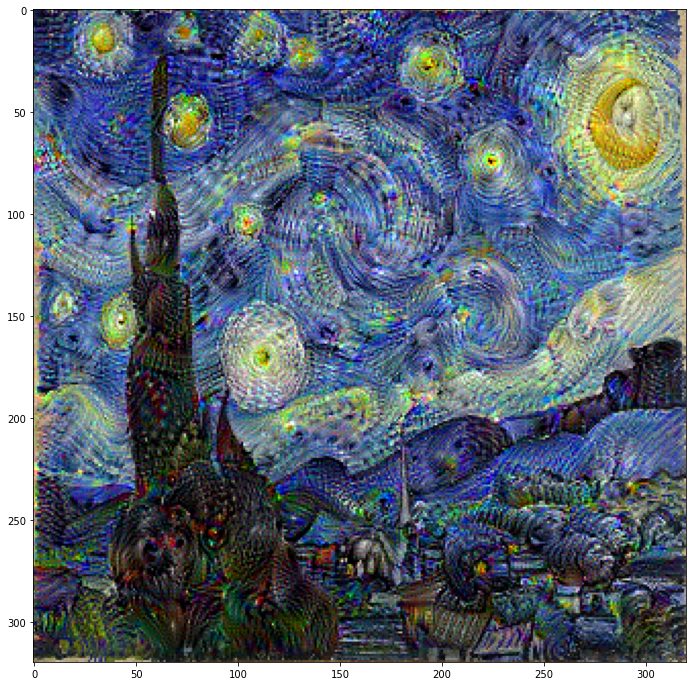

Step 800, loss 2.3134732246398926


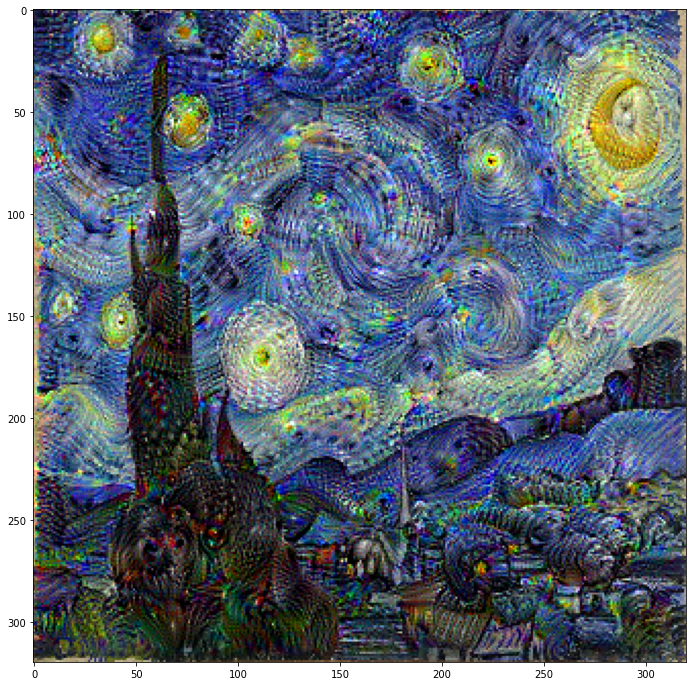

Step 900, loss 2.3727810382843018


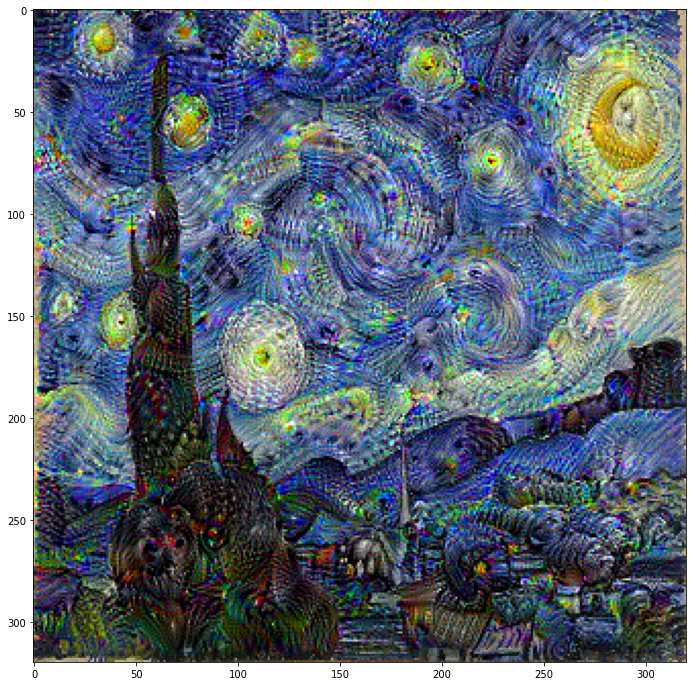

In [21]:
# Deep dream image

new_sample_image= tf.keras.preprocessing.image.load_img(r'/Users/mareksturek/Documents/GitHub/real-application/data/starynight.jpg', target_size = (320, 320))
new_sample_image = np.array(new_sample_image)
dream_img = run_deep_dream_simple(model=deepdream_model, image=new_sample_image, 
                                  steps=1000, step_size=0.001)